

# Lab2: Solving ODEs and Visualizing Dynamic Systems with Animations



---

## Introduction
Dynamic systems are mostly described by ordinary differential equations (ODEs). To predict their behaviors, we must solve ODEs. However, most ODEs do not have analytical solutions, so numerical methods are required. Typical numerical methods for ODEs include:
- **Euler's Method**: A simple, first-order technique for approximating solutions ([Wikipedia](https://en.wikipedia.org/wiki/Euler_method)).
- **Runge-Kutta Methods**: More accurate, higher-order methods widely used in practice ([Wikipedia](https://en.wikipedia.org/wiki/Runge%E2%80%93Kutta_methods)).
- **Multistep Methods**: Such as Adams-Bashforth and Adams-Moulton, which use information from previous steps ([SciPy Docs](https://docs.scipy.org/doc/scipy/reference/generated/scipy.integrate.solve_ivp.html#scipy.integrate.solve_ivp-methods)).

Python provides robust, modern tools for solving ODEs through [SciPy](https://scipy.org/), an open-source scientific computing library. SciPy's ODE solvers implement these and other advanced algorithms, making it a reliable and easy-to-use choice for engineering, physics, and data science applications.


In this lab, we'll solve ODE initial value problems using:
- [SciPy's built-in ODE solvers](https://docs.scipy.org/doc/scipy/reference/generated/scipy.integrate.solve_ivp.html#scipy.integrate.solve_ivp-methods)
- A custom ODE function for the pendulum system
- Animation tools to visualize pendulum motion

## Learning Objectives
1. Introduction to SciPy's ODE solving capabilities
2. Learn to solve both simple and complex ODE systems
3. Create interactive visualizations of dynamic systems

Let's first import some necessary libararies

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp # For solving differential equations
from matplotlib.animation import FuncAnimation # For creating animations
from IPython.display import HTML    # For displaying animations in Jupyter
import matplotlib
matplotlib.rcParams['animation.embed_limit'] = 50  # Increase animation size limit

# For consistent plots in Jupyter
%matplotlib inline
plt.rcParams['figure.figsize'] = (8, 6) # Set default figure size
plt.rcParams['axes.grid'] = True # Enable grid by default

---
## Task 1 – Simple First-Order ODE Example

Let's start with a simple first-order ODE to demonstrate SciPy's [`solve_ivp`](https://docs.scipy.org/doc/scipy/reference/generated/scipy.integrate.solve_ivp.html):

$$\frac{dx}{dt} = -2x + \sin(t)$$

with initial condition $x(0) = 1$. This represents a damped oscillator with sinusoidal forcing.

For this ODE, we can write analytical solution as:
$$x(t) = \frac{1}{5}(2\sin(t) - \cos(t) + 6e^{-2t})$$
We will compare the numerical solution with the analytical solution. We will also use two different methods RK45 and RK23 to numerically solve the ODEs. RK45 is higher order and usually preferred for most ODEs due to better accuracy, while RK23 can be faster for less demanding problems. Both methods automatically adjust their step size to control error.

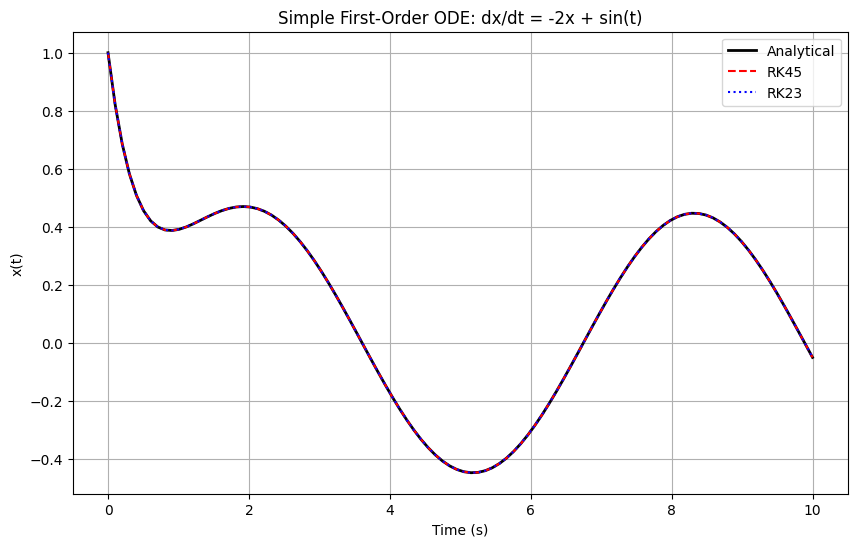

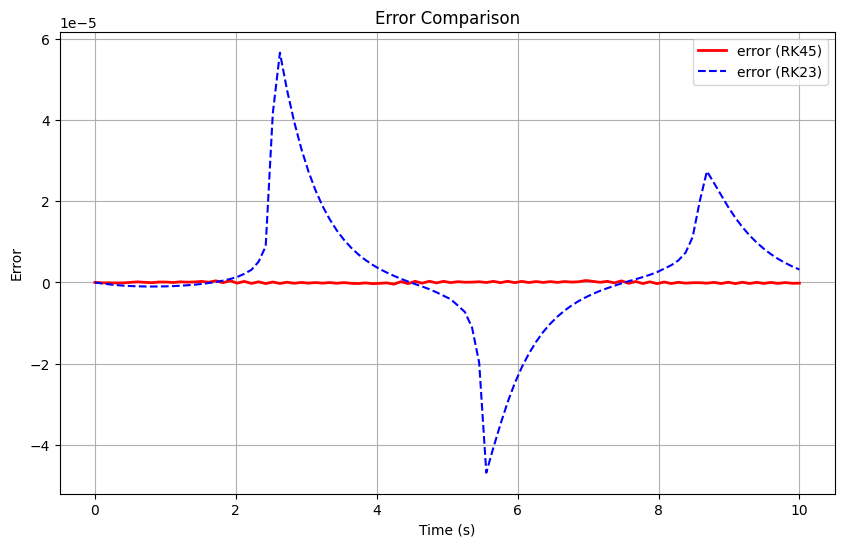

Maximum error (RK45): 4.77e-07
Maximum error (RK23): 5.66e-05


In [ ]:
def simple_ode(t, x):
    """Simple first-order ODE: dx/dt = -2*x + sin(t)"""
    return -2*x + np.sin(t)

def analytical_solution(t):
    """Analytical solution for comparison"""
    return (2*np.sin(t) - np.cos(t) + 6*np.exp(-2*t)) / 5

# Solve the ODE
t_span = (0, 10) # time span
x0 = [1.0]  # initial condition
t_eval = np.linspace(0, 10, 100) # time points where solution is evaluated

# Using different methods
sol_rk45 = solve_ivp(simple_ode, t_span, x0, method='RK45', t_eval=t_eval, rtol=1e-8) #rtol: relative tolerance: default is 1e-3
sol_rk23 = solve_ivp(simple_ode, t_span, x0, method='RK23', t_eval=t_eval, rtol=1e-8)

# Analytical solution for comparison
x_analytical = analytical_solution(t_eval)

# Plot results
plt.figure(figsize=(10, 6))
plt.plot(t_eval, x_analytical, 'k-', linewidth=2, label='Analytical')
plt.plot(sol_rk45.t, sol_rk45.y[0], 'r--', label='RK45')
plt.plot(sol_rk23.t, sol_rk23.y[0], 'b:', label='RK23')
plt.xlabel('Time (s)')
plt.ylabel('x(t)')
plt.title('Simple First-Order ODE: dx/dt = -2x + sin(t)')
plt.legend()
plt.grid(True)

# plot the error with respect to the analytical solution
plt.figure(figsize=(10, 6))
plt.plot(t_eval, sol_rk45.y[0]-x_analytical, 'r-', linewidth=2, label='error (RK45)')
plt.plot(t_eval, sol_rk23.y[0]-x_analytical, 'b--', label='error (RK23)')
plt.xlabel('Time (s)')
plt.ylabel('Error')
plt.title('Error Comparison')
plt.legend()
plt.grid(True)
plt.show()

# Check accuracy
error_rk45 = np.abs(sol_rk45.y[0] - analytical_solution(sol_rk45.t))
print(f"Maximum error (RK45): {np.max(error_rk45):.2e}")
error_rk23 = np.abs(sol_rk23.y[0] - analytical_solution(sol_rk23.t))
print(f"Maximum error (RK23): {np.max(error_rk23):.2e}")

---
## Task 2 – Pendulum System Using SciPy ODE Solvers

Now let's solve the nonlinear pendulum equations of motion **with friction**. The equations become:
$$
\begin{align}
\dot{x}_1 &= x_2 \\
\dot{x}_2 &= -\frac{g}{L}\sin(x_1) - \frac{b}{mL^2}\,x_2
\end{align}
$$

where:
- $x_1 = \theta$ (angle)
- $x_2 = \dot{\theta}$ (angular velocity)
- $g = 9.81\,\text{m/s}^2$
- $m = 1 \,\text{kg}$
- $L = 1\,\text{m}$
- $b = 0.2$ (N.m.s/rad, damping coefficient)

We'll compare different initial conditions and solver methods.

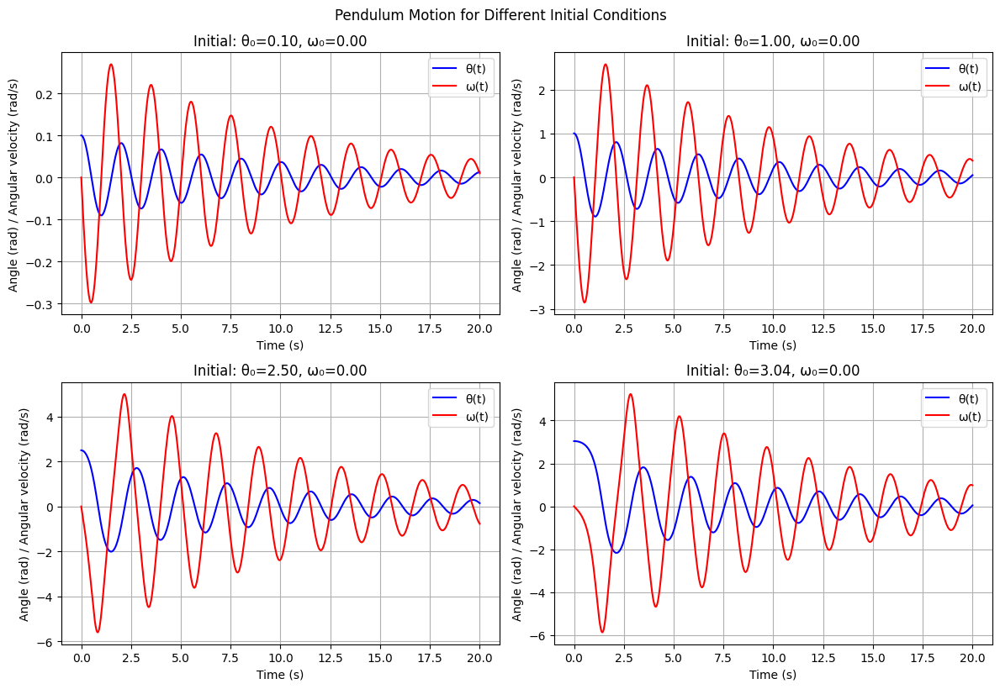

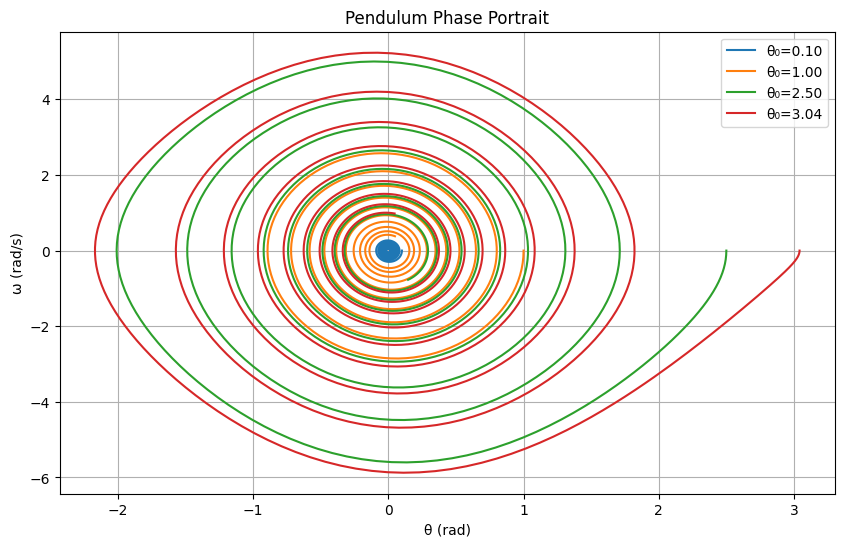

In [ ]:
def pendulum_rhs(t, x, g=9.81, L=1.0, m=1, b=0.2):
    """Right-hand side of the pendulum ODE.
    state: x = [theta, omega]
    Returns [theta_dot, omega_dot].
    """
    theta, omega = x
    theta_dot = omega
    omega_dot = -(g/L)*np.sin(theta) - b*omega/(m*L**2)
    return np.array([theta_dot, omega_dot])

# Different initial conditions
initial_conditions = [
    [0.1, 0.0],   # Small angle
    [1.0, 0.0],   # Medium angle
    [2.5, 0.0],   # Large angle
    [np.pi-0.1, 0.0]  # Near inverted
]

t_span = (0, 20) # time span
t_eval = np.linspace(0, 20, 1000) # time points where solution is evaluated

plt.figure(figsize=(12, 8))

for i, x0 in enumerate(initial_conditions):
    # Solve using RK45
    sol = solve_ivp(pendulum_rhs, t_span, x0, method='RK45', t_eval=t_eval, rtol=1e-8)

    plt.subplot(2, 2, i+1)
    plt.plot(sol.t, sol.y[0], 'b-', label='θ(t)') # y[0] is the angle theta
    plt.plot(sol.t, sol.y[1], 'r-', label='ω(t)') # y[1] is the anglular velocity
    plt.xlabel('Time (s)')
    plt.ylabel('Angle (rad) / Angular velocity (rad/s)')
    plt.title(f'Initial: θ₀={x0[0]:.2f}, ω₀={x0[1]:.2f}')
    plt.legend()
    plt.grid(True)

plt.tight_layout()
# Add a super-title to the figure for all subplots
#y=1.02 means the title is positioned at 102% of the figure height
plt.suptitle('Pendulum Motion for Different Initial Conditions', y=1.02)
plt.show()


# Phase portrait
plt.figure(figsize=(10, 6))
for i, x0 in enumerate(initial_conditions):
    sol = solve_ivp(pendulum_rhs, t_span, x0, method='RK45', t_eval=t_eval, rtol=1e-8)
    plt.plot(sol.y[0], sol.y[1], label=f'θ₀={x0[0]:.2f}')

plt.xlabel('θ (rad)')
plt.ylabel('ω (rad/s)')
plt.title('Pendulum Phase Portrait')
plt.legend()
plt.grid(True)

---
## Task 3 – Animated Pendulum Visualization

In this task, we will create an interactive animation of the pendulum motion. You can modify the initial conditions to see how the pendulum behaves differently. To do this, we will use `FuncAnimation`, a powerful tool from Matplotlib for creating animations in Python.

`FuncAnimation` repeatedly calls a user-defined function to update the plot for each frame, making it ideal for visualizing dynamic systems like the pendulum. For more details, see the [Matplotlib FuncAnimation documentation](https://matplotlib.org/stable/api/animation_api.html#matplotlib.animation.FuncAnimation).

To display the animation directly in a Jupyter notebook, we use `IPython.display.HTML`. After creating the animation object (e.g., `anim`), you can convert it to HTML using `anim.to_jshtml()` and then display it with `display(HTML(anim.to_jshtml()))`. This approach embeds the animation in the notebook, allowing for interactive visualization without saving to an external file.

For more details, see the [Matplotlib animation documentation](https://matplotlib.org/stable/gallery/animation/index.html).


Solving pendulum ODE with θ₀ = 2.00 rad, ω₀ = 0.00 rad/s
ODE solved successfully! Solution contains 240 time points.
Maximum angle reached: 2.00 rad (114.6°)
Creating animation...


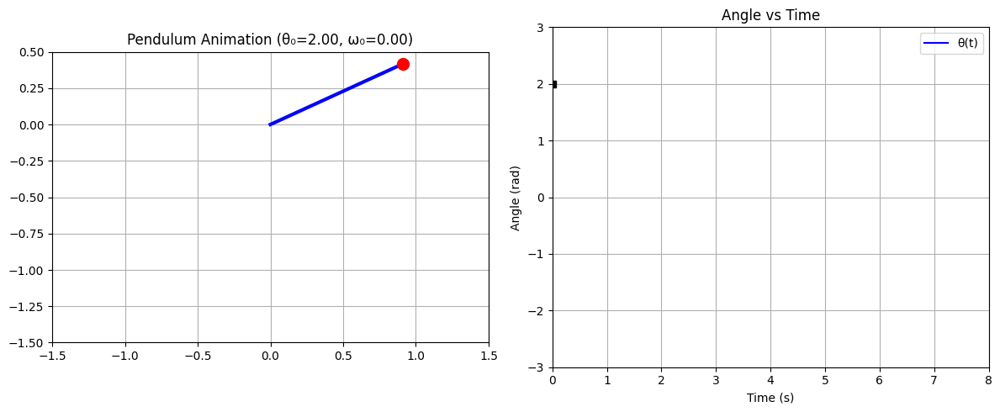

In [ ]:
def solve_pendulum_ode(theta0=1.0, omega0=0.0, L=1.0, g=9.81, m=1.0, b=0.2, duration=10.0):
    """
    Solve the pendulum ODE for given initial conditions.

    Parameters:
    theta0: Initial angle (radians)
    omega0: Initial angular velocity (rad/s)
    L: Pendulum length (m)
    g: Gravitational acceleration (m/s²)
    m: Pendulum mass (kg)
    b: Damping coefficient
    duration: Simulation duration (s)

    Returns:
    sol: Solution object from scipy.integrate.solve_ivp
    """
    # Set up initial conditions and time span
    t_span = (0, duration)
    x0 = [theta0, omega0]
    t_eval = np.linspace(0, duration, int(duration*30))  # 30 fps for smooth animation

    # Solve the ODE system
    # Lambda function used to pass extra parameters (g, L, m, b) to pendulum_rhs.
    # This allows solve_ivp to call pendulum_rhs(t, x, g, L, m, b) while only varying t and x,
    # keeping the physical parameters fixed for the integration.
    sol = solve_ivp(lambda t, x: pendulum_rhs(t, x, g, L, m, b), t_span, x0,
                   method='RK45', t_eval=t_eval, rtol=1e-8)

    return sol

def animate_pendulum_solution(sol, theta0, omega0, L=1.0, duration=10.0):
    """
    Create animation from a solved pendulum ODE solution.

    Parameters:
    sol: Solution object from solve_pendulum_ode
    theta0: Initial angle (for display purposes)
    omega0: Initial angular velocity (for display purposes)
    L: Pendulum length (m)
    duration: Animation duration (s)

    Returns:
    HTML animation object
    """

    # Set up the figure and axis for animation: ax1 for pendulum, ax2 for time series
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

    # Pendulum animation subplot
    ax1.set_xlim(-1.5*L, 1.5*L) # Set x-limits
    ax1.set_ylim(-1.5*L, 0.5*L) # Set y-limits
    ax1.set_aspect('equal') # Ensure equal scaling
    ax1.set_title(f'Pendulum Animation (θ₀={theta0:.2f}, ω₀={omega0:.2f})') # Set title
    ax1.grid(True) # Enable grid

    # Create pendulum elements
    line, = ax1.plot([], [], 'b-', linewidth=3) # Line for rod, blue color
    bob, = ax1.plot([], [], 'ro', markersize=10) # Bob at the end, red color
    trace, = ax1.plot([], [], 'r--', alpha=0.3, linewidth=1) # Trace of the bob

    # Time series subplot
    ax2.set_xlim(0, duration) # Set x-limits
    ax2.set_ylim(-max(abs(theta0), 3), max(abs(theta0), 3)) # Set y-limits
    ax2.set_xlabel('Time (s)') # x-label
    ax2.set_ylabel('Angle (rad)') # y-label
    ax2.set_title('Angle vs Time')  # Set title
    ax2.grid(True)  # Enable grid

    theta_line, = ax2.plot([], [], 'b-', label='θ(t)') # Line for angle over time
    time_marker, = ax2.plot([], [], 'ks', markersize=6) # Current time marker
    ax2.legend()

    # Store trace points
    x_trace, y_trace = [], []

    # Animation function: generate each frame at each time step
    def animate(frame):
        if frame < len(sol.t):
            # Current angle
            theta = sol.y[0][frame]
            t_current = sol.t[frame]

            # Pendulum position
            x_bob = L * np.sin(theta)
            y_bob = -L * np.cos(theta)

            # Update pendulum
            line.set_data([0, x_bob], [0, y_bob])
            bob.set_data([x_bob], [y_bob])

            # Update trace (last 50 points for better performance)
            x_trace.append(x_bob)
            y_trace.append(y_bob)
            if len(x_trace) > 50:
                x_trace.pop(0)
                y_trace.pop(0)
            trace.set_data(x_trace, y_trace)

            # Update time series
            theta_line.set_data(sol.t[:frame+1], sol.y[0][:frame+1])
            time_marker.set_data([t_current], [theta])

        return line, bob, trace, theta_line, time_marker

    # Create and display animation
    anim = FuncAnimation(fig, animate, frames=len(sol.t), interval=100, blit=True, repeat=True)
    plt.tight_layout()
    plt.show()

    # Return HTML version for display
    return HTML(anim.to_jshtml())

# Example usage - modify these initial conditions!
theta_initial = 2.0  # Initial angle in radians (try values like 0.5, 1.5, 3.0, etc.)
omega_initial = 0.0  # Initial angular velocity (try 2.0, -1.0, etc.)
duration = 8.0       # Simulation duration in seconds

print(f"Solving pendulum ODE with θ₀ = {theta_initial:.2f} rad, ω₀ = {omega_initial:.2f} rad/s")

# Step 1: Solve the ODE
solution = solve_pendulum_ode(theta_initial, omega_initial, duration=duration)

print(f"ODE solved successfully! Solution contains {len(solution.t)} time points.")
print(f"Maximum angle reached: {np.max(np.abs(solution.y[0])):.2f} rad ({np.max(np.abs(solution.y[0]))*180/np.pi:.1f}°)")

# Step 2: Create and display animation
print("Creating animation...")
animation_html = animate_pendulum_solution(solution, theta_initial, omega_initial, duration=duration)
display(animation_html)

**Questions to explore based on the simulation:**
1. How does the period change with initial amplitude?
2. What happens when θ₀ approaches π (inverted pendulum)?
3. How does initial angular velocity affect the motion?
4. Can you find initial conditions that make the pendulum rotate continuously?

# HW problems

## Problem 1: Coupled Mass-Spring System

For the coupled mass-spring system shown below:

<center><img src="https://www.cds.caltech.edu/~murray/courses/cds110/sp2024/springmass-coupled.png" width=640></center>

The dynamics of the system are:

$$
\begin{aligned}
    m \ddot{q}_1 &= -2 k q_1 - c \dot{q}_1 + k q_2, \\
    m \ddot{q}_2 &= k q_1 - 2 k q_2 - c \dot{q}_2 + ku
\end{aligned}
$$

Answer the following questions (questions 1–5 require manual derivation; you may attach a separate PDF):

1. Define the state vector $x = [q_1, \dot{q}_1, q_2, \dot{q}_2]^T$, with output $y = q_1$. Write the dynamics in state-space form: $\dot{x} = f(x, u)$, $y = g(x, u)$.
2. Solve the equilibrium point $x_e$ for $\dot{x} = f(x, u)$ when $u = 0$.
3. Solve the operating point $x_d, u_d, y_d$ for a given $y_d$.
4. Is this system linear or nonlinear? Is it time-invariant? Justify.
5. If the system is linear, rewrite in the standard form:  
   $$\dot{x} = Ax + Bu \\ y = Cx + Du$$
6. Programming problem: numerically solve the ODEs for the system with zero control input and the following initial conditions:

   - $[0.1,\, 0,\, -0.1,\, 0]^T$
   - $[0.2,\, 0,\, 0,\, 0]^T$
   - $[0,\, 0.1,\, 0,\, -0.1]^T$
   - $[-0.1,\, 0,\, 0.1,\, 0]^T$

   Plot all four state variables versus time for each initial condition. Explain your simulation results.


## Problem 2: Servo Mechanism
Consider a simple mechanism consisting of a spring loaded arm that is driven by a motor, as shown below. Such a mechanism can be considered as a simplified model for disk drives, robotic actuators, camera gimbals, or any application where precise angular positioning is required and the restoring force is provided by a spring.

<center><img src="https://www.cds.caltech.edu/~murray/courses/cds110/sp2024/servomech-diagram.png" width=200 alt="servomech-diagram"></center>

The motor applies a torque that twists the arm against a linear spring and moves the end of the arm across a rotating platter. The input to the system is the motor torque $\tau_\text{m}$. The force exerted by the spring is a nonlinear function of the head position due to the way it is attached.


The equations of motion for the system are given by
$$
J \ddot \theta = -b \dot\theta - k r\sin\theta + \tau_\text{m},
$$
where
- $J$ is the rotational inertia of the motor (kg·m²)
- $b$ is the viscous damping coefficient (N·m·s/rad)
- $k$ is the linear spring constant (N/m)
- $r$ is the location of spring contact on arm (m)

Answer the following questions (questions 1–4 require manual derivation; you may attach a separate PDF):

1. Define the state vector $x = [\theta,\, \dot{\theta}]^T$ and output $y = \theta$. Write the dynamics in state-space form: $\dot{x} = f(x, u)$, $y = g(x, u)$ with $u=\tau_\text{m}$.

2. Solve the equilibrium point $x_e$ for $\dot{x} = f(x, u)$ when $u = 0$.

3. Solve the operating point $x_d,\, u_d,\, y_d$ for a given $y_d$.

4. Is this system linear or nonlinear? Is it time-invariant? Justify.

5. Programming problem: Assume the values for the parameters:
   $$ k = 1,\quad J = 100,\quad b = 10,
    \quad r = 1
   $$
   Numerically solve the ODEs for the system with zero motor torque and the following initial conditions:
   
     - $[0.1,\, 0]^T$
     - $[0.5,\, 0]^T$
     - $[0,\, 0.2]^T$
     - $[-0.2,\, 0]^T$

    Plot both $\theta$ and $\dot{\theta}$ versus time for each initial condition. Explain your simulation results.


